In [10]:
from tqdm import tqdm_notebook
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
import pandas as pd
from umap import UMAP
import os
from scipy.spatial.distance import pdist, cdist, squareform
from sklearn.cluster import DBSCAN, MeanShift, AgglomerativeClustering, OPTICS, SpectralClustering, KMeans
from sklearn.metrics import silhouette_score,  \
                            davies_bouldin_score, \
                            pairwise_distances, \
                            confusion_matrix, \
                            f1_score, \
                            accuracy_score, \
                            make_scorer, \
                            calinski_harabasz_score, \
                            homogeneity_score, \
                            v_measure_score, \
                            r2_score

from scipy.spatial.distance import jensenshannon
from sklearn.model_selection import cross_val_score, GridSearchCV, KFold, ParameterGrid
from sklearn.linear_model import LogisticRegression, RidgeClassifier
from sklearn.neighbors import KNeighborsRegressor, NearestNeighbors, KernelDensity
from sklearn.manifold import TSNE, LocallyLinearEmbedding, Isomap
from sklearn.decomposition import PCA
from sklearn.multioutput import MultiOutputRegressor
from sklearn.base import BaseEstimator
from sklearn.datasets import make_swiss_roll
# %matplotlib notebook
import matplotlib.pyplot as plt
from itertools import combinations
from collections import defaultdict
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import plotly.express as px
from mpl_toolkits.mplot3d import Axes3D 
import multiprocessing
from joblib import Parallel, delayed
from utils import filter_paths, NPR, clustering, mae_score, FIGSIZE, DPI, FONTSIZE, DB_THRESHOLD_DISTINCT, SILHOETTE_THRESHOLD_DISTINCT, plot_clustering
from copy import copy
np.random.seed(42)
from lightgbm import LGBMClassifier

from coranking import coranking_matrix
from coranking.metrics import continuity, LCMC, trustworthiness


Bad key "text.kerning_factor" on line 4 in
/media/hpc2_storage/ibulygin/miniconda3/envs/fresh/lib/python3.7/site-packages/matplotlib/mpl-data/stylelib/_classic_test_patch.mplstyle.
You probably need to get an updated matplotlibrc file from
https://github.com/matplotlib/matplotlib/blob/v3.1.3/matplotlibrc.template
or from the matplotlib source distribution


In [11]:
knn = KNeighborsRegressor()
mo = MultiOutputRegressor(knn)
mae_scorer = make_scorer(mae_score, greater_is_better=False)
r2_scorer = make_scorer(r2_score)

In [12]:
# def AUC(Q):
#     m = Q.shape[0]+1
#     UL_cumulative = 0 
#     auc = 0
#     Q_k = []
#     LCMC_k = []
#     for k in range(0, Q.shape[0]):
#         r = Q[k:k+1,:k+1].sum()
#         c = Q[:k,k:k+1].sum()
#         UL_cumulative += (r+c)
#         Qnk = UL_cumulative/((k+1)*m) # (k+1)
#         Q_k.append(Qnk)
#         LCMC_k.append(Qnk - ((k+1)/(m-1)))
#     return np.mean(Q_k), Q_k, LCMC_k

In [13]:
# Q = coranking_matrix(data_swiss, data_swiss)
# # metrics
# auc, Q_k, LCMC_k = AUC(Q)
# auc
# plt.plot(lcmc)
# plt.plot(LCMC_k)

# Test

In [1]:
# results_swiss = defaultdict(dict)
# data_swiss, color_swiss = make_swiss_roll(n_samples=1000)
# n = data_swiss.shape[0]
# methods ={'tsne':TSNE(n_components=2, metric='manhattan', random_state=42, init='pca', n_jobs=-1),
#           'umap':UMAP(n_components=2, min_dist=0.0, spread = 1., metric='manhattan', random_state=42),
#           'lle':LocallyLinearEmbedding(n_components=2),
#           'isomap':Isomap(n_components=2),
#           'pca':PCA(n_components=2)}

# fig,axes = plt.subplots(ncols=len(methods), nrows=2, figsize=(len(methods)*5,10), dpi=100)
# for i,(method_name, method) in tqdm_notebook(enumerate(methods.items())):
#     emb = method.fit_transform(data_swiss)
#     Q = coranking_matrix(data_swiss, emb)
    
#     # metrics
#     auc, Q_k, LCMC_k = AUC(Q)
#     mae = -cross_val_score(mo, emb, data_swiss, scoring=mae_scorer, cv=3, n_jobs=-1).mean()
#     npr = NPR(data_swiss, emb)
#     lcmc = LCMC(Q, max_k=n)
#     argmax_k = np.argmax(lcmc)
#     k_max = np.arange(1,n)[argmax_k]
#     Q_loc = (1./k_max)*np.sum(Q_k[:argmax_k+1])
#     Q_glob = (1./(n-k_max))*np.sum(Q_k[argmax_k+1:])

#     axes[0,i].scatter(emb[:,0], emb[:,1], c=color_swiss) 
#     axes[0,i].set_title(f'{method_name}, \n NPR:{npr} \n MAE: {mae} \n AUC: {auc} \n Q_loc: {Q_loc} \n Q_glob: {Q_glob}')
    
#     axes[1,i].plot(lcmc) 
#     axes[1,i].set_title(f'LCMC')

#     results_swiss[method_name]['AUC'] = auc
#     results_swiss[method_name]['MAE'] = mae
#     results_swiss[method_name]['NPR'] = npr
#     results_swiss[method_name]['Q_loc'] = npr
#     results_swiss[method_name]['Q_glob'] = npr

# plt.tight_layout()
# plt.show()

# Real data

In [14]:
root_separate = './separate_datasets_proj/'
DATASETS = ['AGP_proj_o', 'AGP_proj_f', 'AGP_proj_g', \
            'HMP_proj_o', 'HMP_proj_f', 'HMP_proj_g'] 

paths_separate = filter_paths([os.path.join(root_separate,path) for path in os.listdir(root_separate)], keywords=DATASETS)

data_pca = {}
for path in paths_separate:
    label = path.split('/')[-1].split('.')[0]
    data_pca[label] = np.genfromtxt(path, delimiter=';')

In [15]:
# root_transf= './separate_datasets_transformed/'
# DATASETS = ['AGP_proj_o', 'AGP_proj_f', 'AGP_proj_g', \
#             'HMP_proj_o', 'HMP_proj_f', 'HMP_proj_g']

# paths_trans= filter_paths([os.path.join(root_transf,path) for path in os.listdir(root_transf)], keywords=DATASETS)

# data_lle = {}
# data_isomap = {}
# data_ae = {}

# for path in paths_trans:
#     label = path.split('/')[-1].split('.')[0]
#     if 'lle' in path:
#         data_lle[label] = np.genfromtxt(path, delimiter=';')
#     if 'isomap' in path:
#         data_isomap[label] = np.genfromtxt(path, delimiter=';') 
#     if 'ae' in path:
#         data_ae[label] = np.load(path, allow_pickle=True)          

In [16]:
data_orig = {}
for dataset in ['AGP', 'HMP']:
    for tax_level in ['o', 'f', 'g']:
        dataframe_out = pd.read_csv(f'{dataset}/pivot_{tax_level}_normalized.csv', skipinitialspace=True, sep=';', engine='python')
        dataframe_out = dataframe_out.drop('Unnamed: 0', axis = 1)
        data_orig['_'.join([dataset, tax_level])] = dataframe_out

# Compare Original and PCA for dimensionality reduction

In [17]:
# data_metrics = {'Orig':defaultdict(list),
#                'PCA':defaultdict(list)}

# for k_orig, k_pca in tqdm_notebook(zip(data_orig.keys(), data_pca.keys())):
#     for v,k in zip([data_orig[k_orig], data_pca[k_pca]], [k_orig, k_pca]):
#         ump = UMAP(n_jobs=-1)
#         v_trans = ump.fit_transform(v)
#         r2_score = -cross_val_score(mo, v_trans, v, scoring=r2_scorer, cv=3, n_jobs=-1).mean()
#         mae_score = -cross_val_score(mo, v_trans, v, scoring=mae_scorer, cv=3, n_jobs=-1).mean()

#         npr = NPR(v, v_trans)
#         key = 'PCA' if 'proj' in k.split('_') else 'Orig'
        
#         data_metrics[key]['NPR'].append(npr)
#         data_metrics[key]['nMAE'].append(mae_score)
#         data_metrics[key]['R2'].append(r2_score)


In [7]:
# fig, ax = plt.subplots(ncols=3, nrows=1, figsize=(15,3))

# for i,(k1,v1) in enumerate(data_metrics.items()):
#     for j,(k2,v2) in enumerate(v1.items()):
#         ax[j].plot(v2,label=k1)
#         ax[j].set_title(k2)
# plt.legend()
# plt.show()

Original data is always better for dimensionality reduction for nMAE

# Perc range

In [5]:
# dataset_name = 'AGP'
# taxonomic_level = 'o'
# data = datasets_separate[f'{dataset_name}_proj_{taxonomic_level}']

In [4]:
# perc_list = []
# knn_range = np.arange(5, 100, 1)
# for n_neighbors in tqdm_notebook(knn_range):
#     nn = NearestNeighbors(n_neighbors=n_neighbors)
#     nn.fit(data)
#     neigborhood_X_dist, neigborhood_X_ind = nn.kneighbors(data, n_neighbors=n_neighbors)
#     mean_neigh_distances = neigborhood_X_dist[:,1:].mean(1)
# #     perc_list.append(np.percentile(mean_neigh_distances, 0.9))
#     perc_list.append(np.mean(mean_neigh_distances))    

In [5]:
# plt.figure()
# plt.plot(knn_range, perc_list)
# plt.show()

# Isomap

In [32]:
# fig, ax = plt.subplots(ncols=3, nrows=2, figsize=(15,10), dpi=300)
# for i,dataset_name in enumerate(['AGP', 'ptb'], start=0):
#     for j,tax_name in enumerate(['o', 'f', 'g'], start=0):
#         label = '_'.join([dataset_name, 'proj', tax_name])
#         data = datasets_separate[label]
#         ismp = Isomap(n_neighbors=30, n_components=2, p=1, n_jobs=-1)
#         v = ismp.fit_transform(data)
#         ax[i,j].scatter(v[:,0], v[:,1], marker='.', alpha=0.1, color='black')
#         ax[i,j].set_title(f'Dataset: {dataset_name}, Tax: {tax_name.upper()}', fontsize=20)
#     plt.suptitle('Isomap embeddings', fontsize=20)
# plt.show()

# LLE

In [10]:
# fig, ax = plt.subplots(ncols=3, nrows=2, figsize=(15,10), dpi=300)
# for i,dataset_name in enumerate(['AGP', 'ptb'], start=0):
#     for j,tax_name in enumerate(['o', 'f', 'g'], start=0):
#         label = '_'.join([dataset_name, 'proj', tax_name])
#         data = datasets_separate[label]
#         ismp = LocallyLinearEmbedding(n_neighbors=30, n_components=2, p=1, n_jobs=-1)
#         v = ismp.fit_transform(data)
#         ax[i,j].scatter(v[:,0], v[:,1], marker='.', alpha=0.1, color='black')
#         ax[i,j].set_title(f'Dataset: {dataset_name}, Tax: {tax_name.upper()}', fontsize=20)
#     plt.suptitle('Isomap embeddings', fontsize=20)
# plt.show()

# UMAP 2D

In [3]:
def cross_validate(X,Z):
    knn = KNeighborsRegressor()
    mo = MultiOutputRegressor(knn)
    mae_scorer = make_scorer(mae_score, greater_is_better=False)
    return -cross_val_score(mo, Z, X, scoring=mae_scorer, cv=3, n_jobs=-1).mean()

In [19]:
def calculate_Q_mae(X, Z):
    
    Q = coranking_matrix(X, Z)
    
    m = X.shape[0]
    UL_cumulative = 0 
    Q_k = []
    LCMC_k = []
    for k in range(0, Q.shape[0]):
        r = Q[k:k+1,:k+1].sum()
        c = Q[:k,k:k+1].sum()
        UL_cumulative += (r+c)
        Qnk = UL_cumulative/((k+1)*m) # (k+1)
        Q_k.append(Qnk)
        LCMC_k.append(Qnk - ((k+1)/(m-1)))
    
    argmax_k = np.argmax(LCMC_k)
    k_max = np.arange(1.,m)[argmax_k]
    Q_loc = (1./k_max)*np.sum(Q_k[:argmax_k+1])
    Q_glob = (1./(m-k_max))*np.sum(Q_k[argmax_k+1:])
    
    mae = cross_validate(X, Z)
    
    return Q_loc, Q_glob, mae

In [134]:
def transform(method, X, parameters, scorer, return_Z=False):
    model_inst = method(n_components=3, **parameters)
    Z = model_inst.fit_transform(X)
    if return_Z:
        return scorer(X,Z), Z
    else:
        return scorer(X,Z)

In [135]:
umap_param_score_Z = defaultdict(list)

umap_param_grid = {'n_neighbors':[25],
                   'min_dist':np.linspace(0.2,0.7, num=10),
                   'metric':['euclidean']}

for label, X in tqdm_notebook(data_pca.items()):
    res = Parallel(n_jobs=10)(delayed(transform)(UMAP,
                                                X, 
                                                model_params,
                                                calculate_Q_mae,
                                                return_Z = True) \
                                                for model_params in ParameterGrid(umap_param_grid)) 
        
    umap_param_score_Z[label]= res

TerminatedWorkerError: A worker process managed by the executor was unexpectedly terminated. This could be caused by a segmentation fault while calling the function or by an excessive memory usage causing the Operating System to kill the worker.

The exit codes of the workers are {SIGKILL(-9)}

In [ ]:
# np.save('umap_param_score_Z_v3_3d',umap_param_score_Z)

In [142]:
umap_param_score_Z = np.load('./umap_param_score_Z_v1.npy', allow_pickle=True).item()

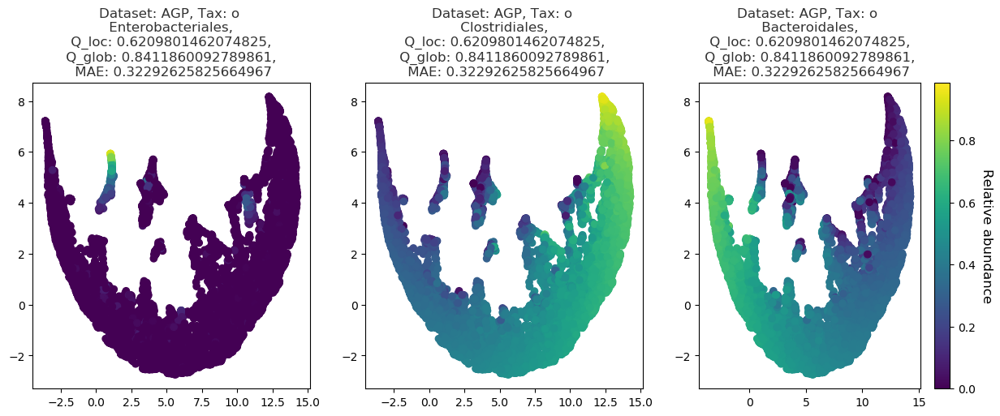

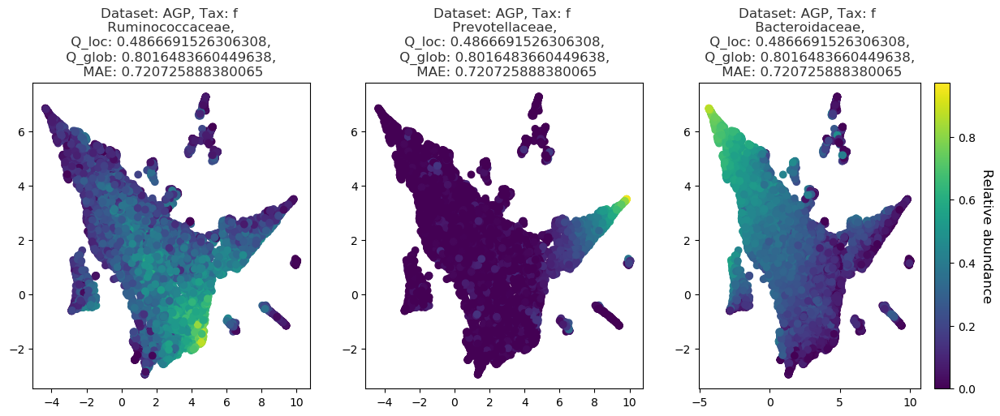

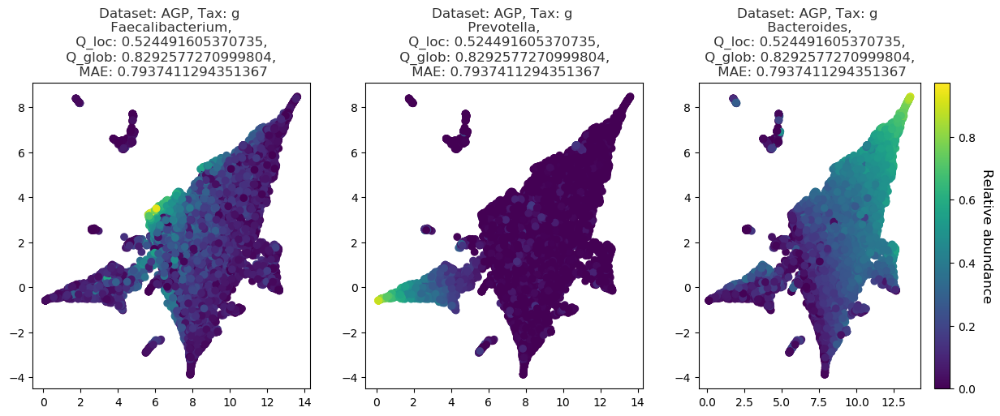

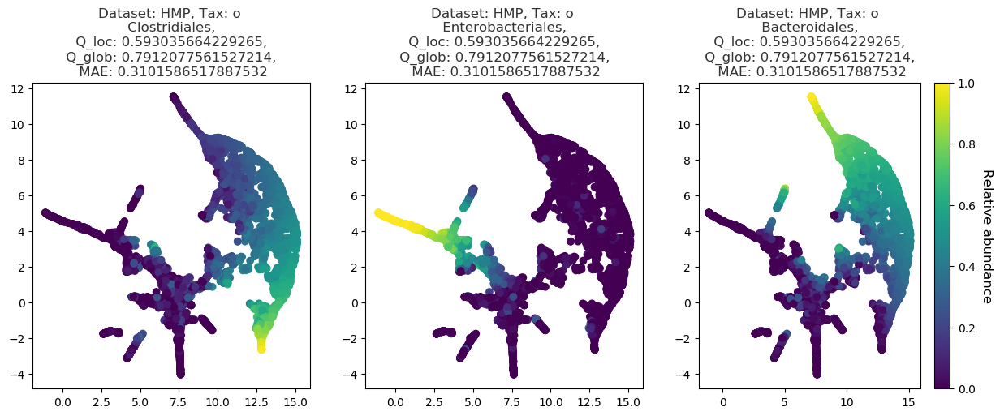

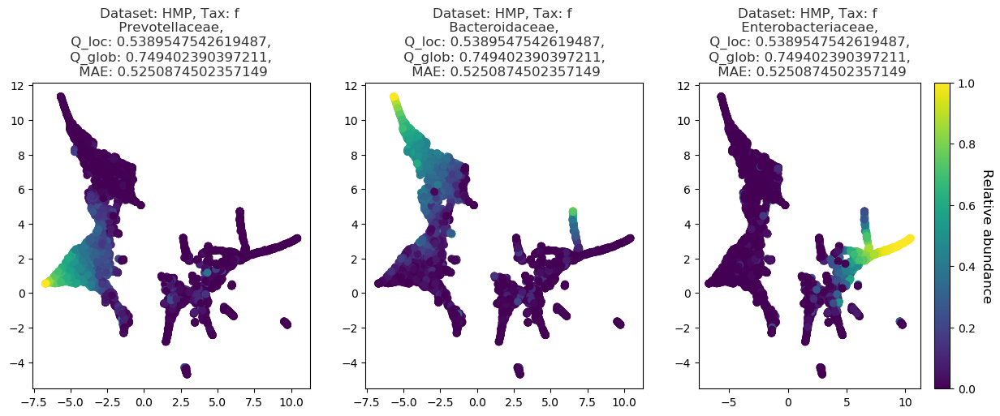

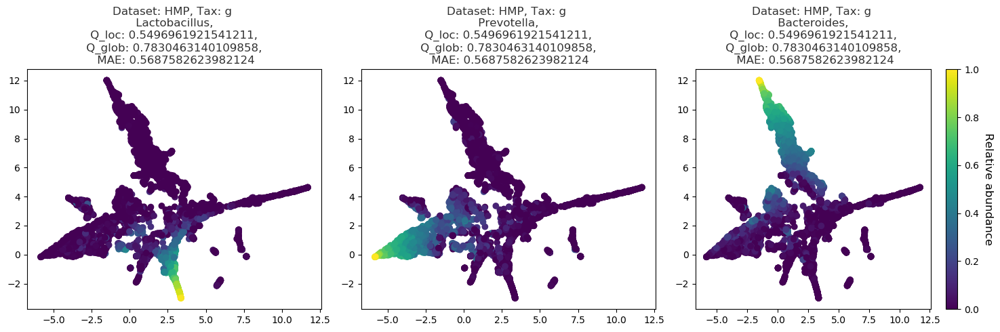

In [144]:
# n_show = 3
# for label, scores_Z in umap_param_score_Z.items():
#     dataset, _, tax = label.split('_')
#     spurios_name = tax + '__'
#     X_orig = data_orig[dataset + '_' + tax]
#     if spurios_name in X_orig.columns:
#         X_orig = X_orig.drop(spurios_name , axis=1)
#     n_params= len(scores_Z)
#     fig, axes = plt.subplots(ncols=n_show, nrows=1, figsize=(n_show*5,5), dpi=100)
    
#     (Q_loc, Q_glob, mae), Z = scores_Z[0]
    
#     var_s = X_orig.var(0)
#     c_s = list(var_s[np.argsort(var_s)][-n_show:].index)
    
#     for i,c_i in enumerate(c_s):
#         mp = axes[i].scatter(Z[:,0], Z[:,1], c=X_orig[c_i])
#         c_name = c_i.split('_')[-1]
# #          \n Q_loc: {Q_loc}, \n Q_glob: {Q_glob}, \n MAE: {mae}
#         axes[i].set_title(f'Dataset: {dataset}, Tax: {tax} \n {c_name}, \n Q_loc: {Q_loc}, \n Q_glob: {Q_glob}, \n MAE: {mae}', fontsize=FONTSIZE, alpha=0.8) # 
        
#     cbar = fig.colorbar(mp)
#     cbar.set_label('Relative abundance', rotation=270, fontsize=FONTSIZE, labelpad=15)

# plt.tight_layout()
# plt.show()

# Clumps clustering

In [118]:
# for i,dataset_name in enumerate(['AGP', 'ptb'], start=0):
#     for j,tax_name in enumerate(['o', 'f', 'g'], start=0):
#         label = '_'.join([dataset_name, tax_name])
#         errs = best_umap_errs[label]
#         print(dataset_name, tax_name, min(errs))

In [ ]:
umap_param_score = defaultdict(dict)

scorer = cross_validate
# scorer = calculate_Q_stats

umap_param_grid = {'n_neighbors':[3,5,10,20,40],
                   'min_dist':[0.01, 0.05, 0.1, 0.2, 0.4, 0.5],
                   'metric':['manhattan']}

for label, X in tqdm_notebook(data_pca.items()):
    errors = Parallel(n_jobs=-1)(delayed(transform)(UMAP,
                                                    X, 
                                                    model_params,
                                                    scorer) \
                                                    for model_params in ParameterGrid(umap_param_grid)) 
        
#         min_re_index = np.argmin(errors)
#         best_params = list(ParameterGrid(umap_param_grid))[min_re_index]
#         best_umap_params[label] = best_params
#         best_umap_errs[label] = errors
        
    umap_param_score[label] = errors
    
errors = np.array(errors)

In [65]:
# g__abundance_dict = defaultdict(dict)
# specific_OTUs = ['g__Bacteroides', 'g__Prevotella', 'g__Ruminococcus']
# for otu in specific_OTUs:
#     for i,dataset_name in enumerate(['AGP', 'ptb'], start=0):
#         label = '_'.join([dataset_name, 'g'])
#         g__abundance_dict[otu][dataset_name] = data_orig[label][otu]

In [ ]:
def check_kneigh_variance(data,c,n_neighbors=5):
    nn = NearestNeighbors(n_neighbors=n_neighbors)
    nn.fit(data)
    neigborhood_X_dist, neigborhood_X_ind = nn.kneighbors(data, n_neighbors=n_neighbors)
    
    mean_neigh_distances = neigborhood_X_dist[:,1:].mean(1)
#     perc_list.append(np.percentile(mean_neigh_distances, 0.9))
    perc_list.append(np.mean(mean_neigh_distances))  

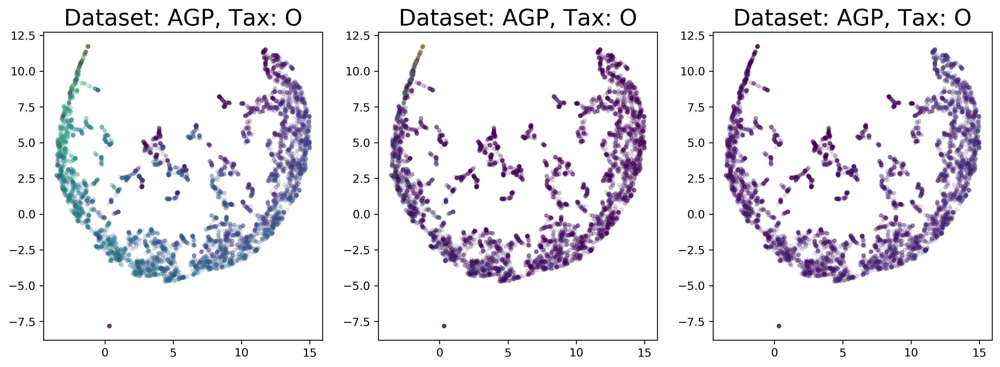

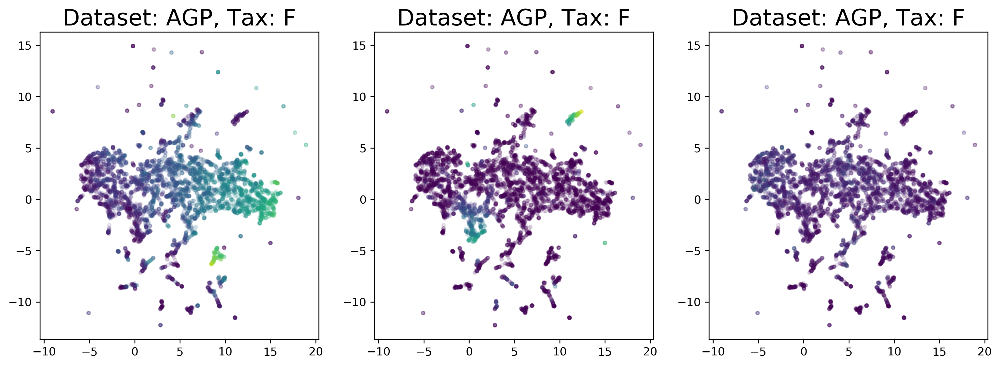

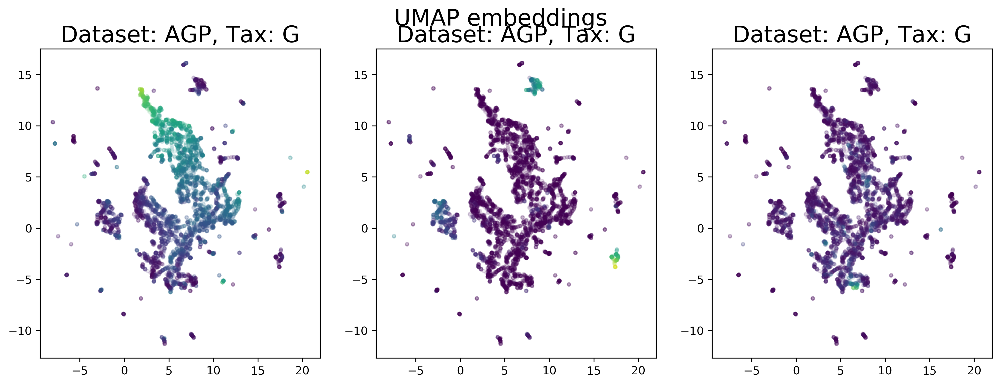

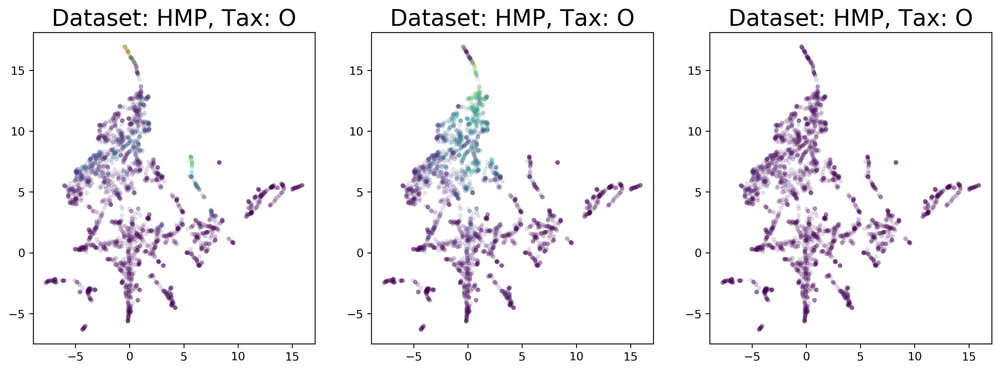

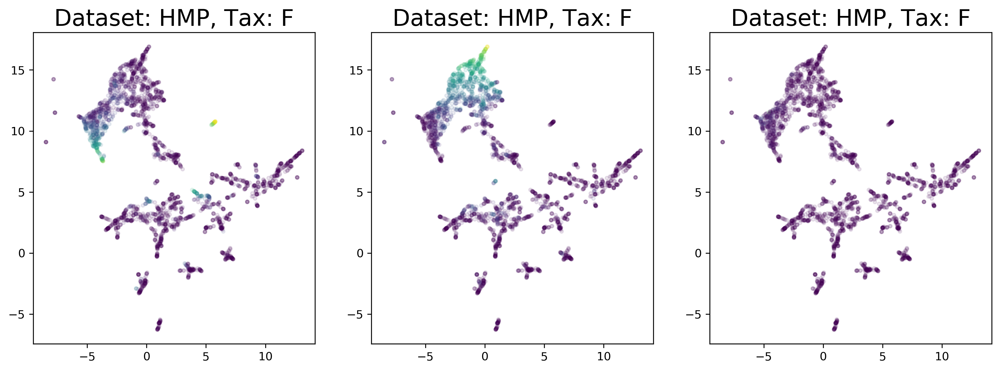

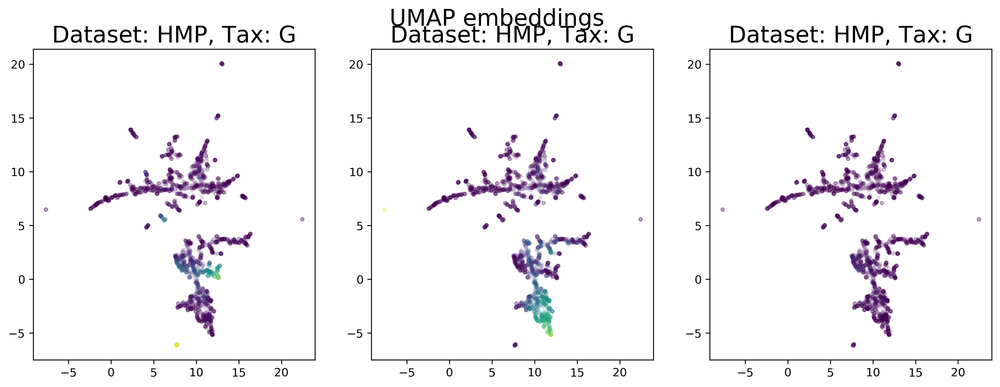

In [122]:
best_umap_2d_embeddings = {}
for i,dataset_name in enumerate(['AGP', 'ptb'], start=0):
    for j,tax_name in enumerate(['o', 'f', 'g'], start=0):
        label = '_'.join([dataset_name, tax_name])
        data = data_orig[label]
        ump = UMAP(**best_umap_params[label])
        v = ump.fit_transform(data)
        savepath = f'./visualizations/UMAP2D_{dataset_name}_{tax_name}'
        if not os.path.isfile(savepath):
            np.save(savepath, v)
        l = 'HMP' if dataset_name == 'ptb' else 'AGP'
        
        fig, ax = plt.subplots(ncols=3, nrows=1, figsize=(15,5), dpi=300)
        for otu_number,(k,c) in enumerate(g__abundance_dict.items()):
            # k - OTU name
            # c - values
            c_ = c[dataset_name]
        
            ax[otu_number].scatter(v[:,0], v[:,1], marker='.', alpha=0.1,c=c_) # , color='black'
            ax[otu_number].set_title(f'Dataset: {l}, Tax: {tax_name.upper()}', fontsize=20)
            
#         fig.suptitle('UMAP embeddings', fontsize=20)
plt.show()

In [50]:
data_HMP_umap = {'HMP_umap_g':np.load('./visualizations/UMAP2D_ptb_g.npy')}

# LABEL2DBSCAN_PARAMS = {}
# for label,data in data_HMP_umap.items():
#     p95_list = get_neigh_perc(data)
#     LABEL2DBSCAN_PARAMS_PCA[label] = [min(p95_list), max(p95_list)]

cluster_results, cluster_preds = clustering(data_HMP_umap, 
                                            KMeans, 
                                            np.arange(2, 15, 1), 
                                            dbscan=False, 
                                            dbscan_params_dict=None)

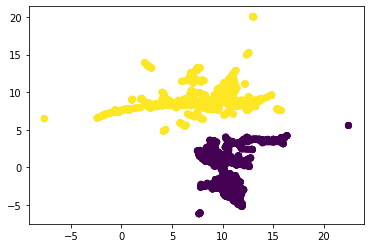

In [59]:
plt.scatter(data_HMP_umap['HMP_umap_g'][:,0], data_HMP_umap['HMP_umap_g'][:,1], c=cluster_preds['HMP_umap_g'][2])
plt.show()

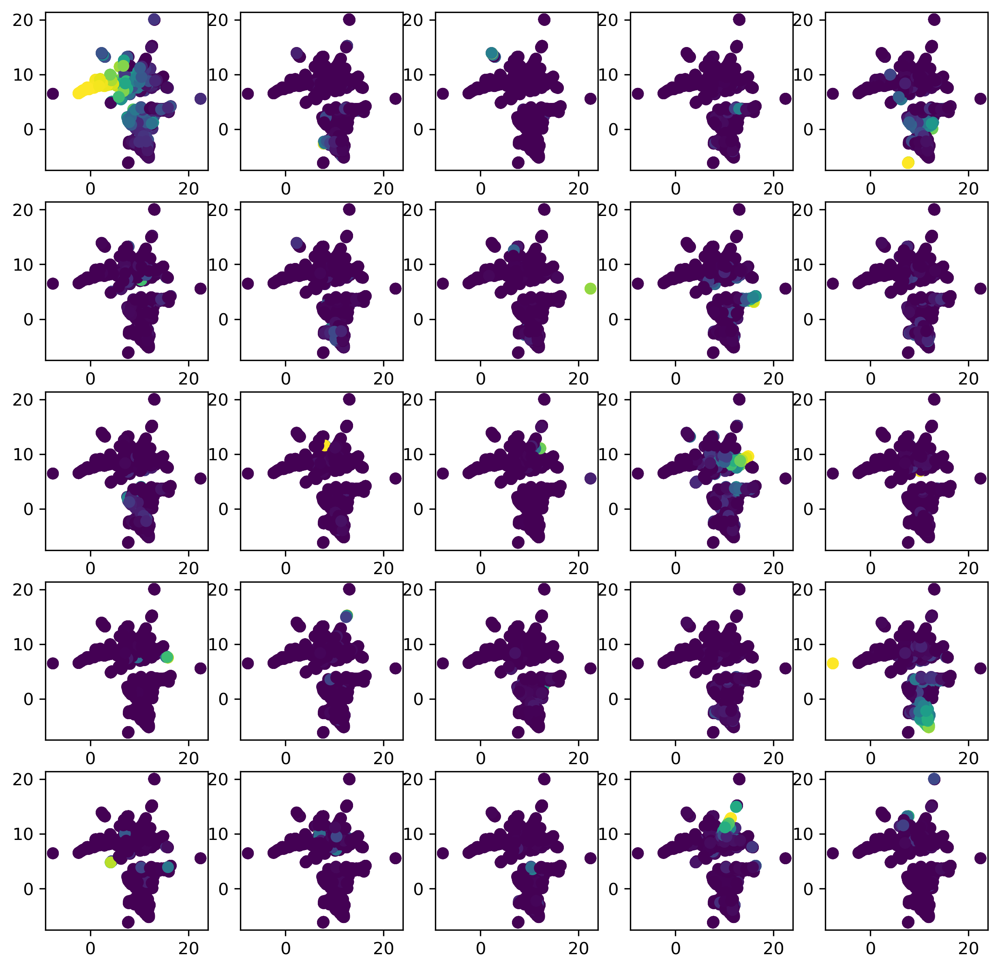

In [91]:
fig, axes = plt.subplots(5,5,figsize=(10,10),dpi=300)
axes = axes.flatten()
for i,otu_name in enumerate(data_orig['ptb_g'].columns[data_orig['ptb_g'].sum(0) > 20]):
    axes[i].scatter(data_HMP_umap['HMP_umap_g'][:,0], data_HMP_umap['HMP_umap_g'][:,1], c=data_orig['ptb_g'][otu_name])

plt.tight_layout()
plt.show()

In [6]:
# plot_clustering(cluster_results, method='Manifold Learning method: UMAP', suptitle='Clustering method: KMeans')

# t-SNE 2D

In [ ]:
best_tsne_params = {}
best_tsne_errs = {}

tsne_param_grid = {'n_neighbors':[3,5,10,20,40,80],
                   'min_dist':[0.01, 0.05, 0.1, 0.2, 0.4, 0.8],
                   'metric':[js_jit, 'manhattan', 'braycurtis', 'canberra']}


for i,dataset_name in enumerate(['AGP', 'ptb'], start=0):
    for j,tax_name in tqdm_notebook(enumerate(['o', 'f', 'g'], start=0)):
        label = '_'.join([dataset_name, tax_name])
        X = data_orig[label]
        assert not X.isna().values.any()
        errors = Parallel(n_jobs=-1)(delayed(transform)(UMAP,
                                                        mo,
                                                        X, 
                                                        model_params,
                                                        mae_scorer) \
                                                        for model_params in ParameterGrid(tsne_param_grid)) 
        
        min_re_index = np.argmin(errors)
        best_params = list(ParameterGrid(umap_param_grid))[min_re_index]
        best_umap_params[label] = best_params
        best_umap_errs[label] = errors

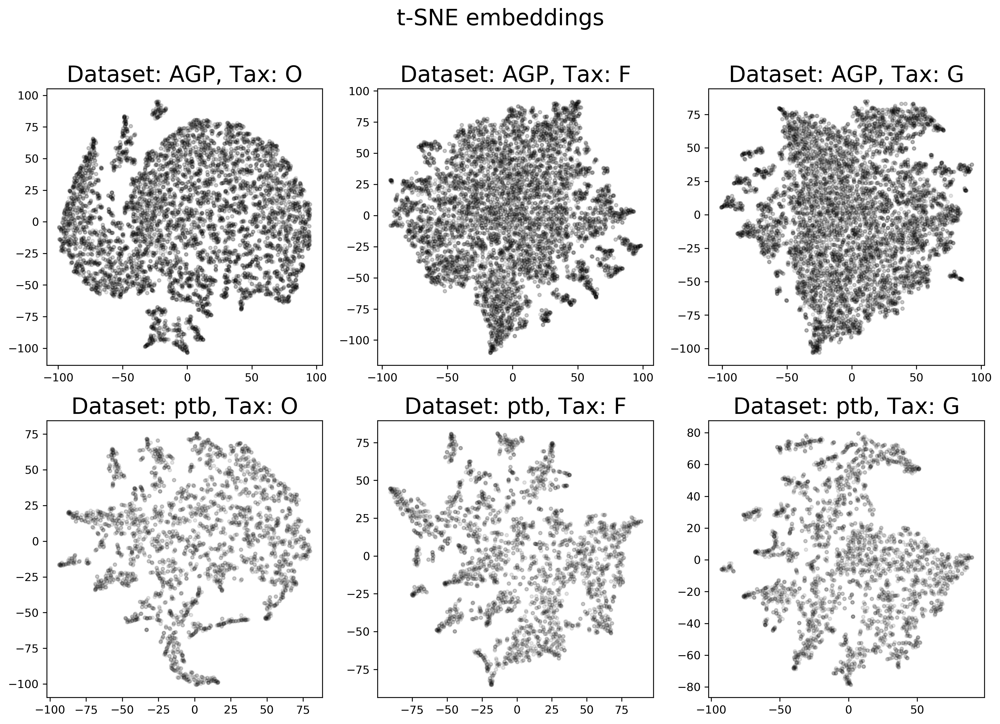

In [153]:
fig, ax = plt.subplots(ncols=3, nrows=2, figsize=(15,10), dpi=300)
for i,dataset_name in enumerate(['AGP', 'ptb'], start=0):
    for j,tax_name in enumerate(['o', 'f', 'g'], start=0):
        label = '_'.join([dataset_name, 'proj', tax_name])
        data = datasets_separate[label]
        ump = TSNE(n_components=2, perplexity=15, metric='manhattan', n_jobs=-1)
        v = ump.fit_transform(data)
        l = 'HMP' if dataset_name == 'ptb' else 'AGP'
        ax[i,j].scatter(v[:,0], v[:,1], marker='.', alpha=0.1, color='black')
        ax[i,j].set_title(f'Dataset: {l}, Tax: {tax_name.upper()}', fontsize=20)
    plt.suptitle('t-SNE embeddings', fontsize=20)
plt.show()

# Bacteroides, Prevotella, Riminococcus

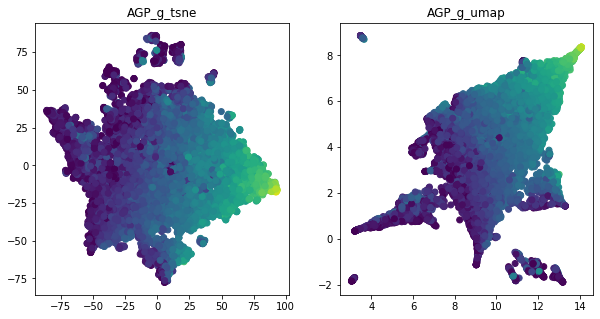

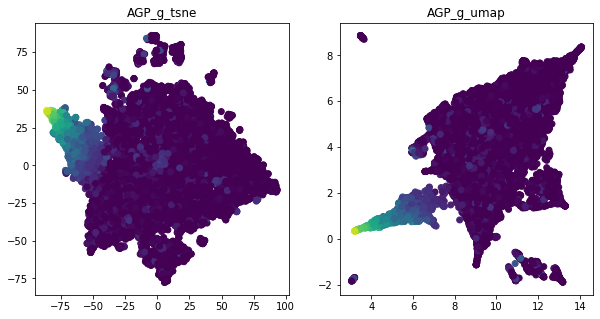

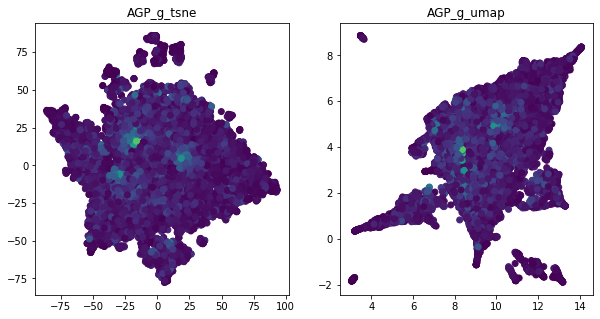

In [31]:
dataset = 'AGP'
embeddings = {}
n_neighbours = 30
methods ={'tsne':TSNE(n_components=2, perplexity=min(30,n_neighbours), metric='manhattan', random_state=42, init='pca', n_jobs=-1),
          'umap':UMAP(n_neighbors=n_neighbours, n_components=2, min_dist=0.0, spread = 1., metric='manhattan', random_state=42)}

for tax_level in ['g']: # 'o','f',

    data_out = datasets_separate[f'{dataset}_proj_{tax_level}']
#     dataframe_out = pd.read_csv(f'{dataset}/pivot_{tax_level}_normalized.csv', skipinitialspace=True, sep=';', engine='python')
#     dataframe_out = dataframe_out.drop('Unnamed: 0', axis = 1)#.values
    
    dataframe_out = data_orig['_'.join([dataset, 'g'])]
    
    b,p,r = dataframe_out['g__Bacteroides'] , dataframe_out['g__Prevotella'], dataframe_out['g__Ruminococcus']
    for j,c in enumerate([b,p,r]):
        fig,axes = plt.subplots(ncols=2, nrows=1, figsize=(10,5))
        for i,(method_name, method) in enumerate(methods.items()): # , start=j*len(methods)
            label = '_'.join([dataset, tax_level, method_name])
            embedding = method.fit_transform(data_out)
            embeddings[label] = embedding
            axes[i].scatter(embedding[:, 0], embedding[:, 1], c=c)
            axes[i].set_title(label)
plt.show()

In [ ]:
method.

# Analyze outliers groups

In [37]:
clustering_results = defaultdict(dict)

clustering_name = 'DBSCAN' # 'DBSCAN' ,'KMeans', 'AgglomerativeClustering'

for label, embedding in tqdm_notebook(embeddings.items()):
    
    dataset_name, tax_level, method_name = label.split('_')
    data_out = datasets_separate[f'{dataset_name}_proj_{tax_level}']
    dataframe_out = pd.read_csv(f'{dataset_name}/pivot_{tax_level}_normalized.csv', skipinitialspace=True, sep=';', engine='python')
    dataframe_out = dataframe_out.drop('Unnamed: 0', axis = 1)#.values
    
    if clustering_name == 'DBSCAN':
        nn=NearestNeighbors(n_neighbors=10)
        nn.fit(embedding)
        embedding_kneighbours,_ = nn.kneighbors(embedding)
    #     m = embedding_kneighbours[:,1:].max()
        m = np.quantile(embedding_kneighbours[:,1:].flatten(), q=0.999)
        clustering_method = DBSCAN(eps=m)
    elif clustering_name == 'AgglomerativeClustering':
        clustering_method = AgglomerativeClustering(n_clusters=4)
    elif clustering_name == 'KMeans':
        clustering_method = KMeans(n_clusters=4)
    else:
        raise RuntimeError
    
    y = clustering_method.fit_predict(embedding)
    clustering_results[label]['y'] = y
    non_noise_mask = y!=-1
    n_clusters = len(np.unique(y[non_noise_mask]))
    
    print(f'n_clusters: {n_clusters} for {label}')

    npr = NPR(data_out[non_noise_mask], embedding[non_noise_mask], n_neighbours)
    
    if n_clusters > 1:
        sh_orig = silhouette_score(dataframe_out[non_noise_mask], y[non_noise_mask])
        db_orig = davies_bouldin_score(dataframe_out[non_noise_mask], y[non_noise_mask])
        sh_emb = silhouette_score(embedding[non_noise_mask], y[non_noise_mask])
        db_emb = davies_bouldin_score(embedding[non_noise_mask], y[non_noise_mask])

        sh_emb = "{:.2f}".format(sh_emb)
        db_emb = "{:.2f}".format(db_emb)
        sh_orig = "{:.2f}".format(sh_orig)
        db_orig = "{:.2f}".format(db_orig)

        clustering_results[label]['sh_emb'] = sh_emb
        clustering_results[label]['db_emb'] = db_emb
        clustering_results[label]['sh_orig'] = sh_orig
        clustering_results[label]['db_orig'] = db_orig

#     break
#     plt.figure()
#     plt.scatter(embedding[:, 0][y==-1], embedding[:, 1][y==-1], label=f'noise', color='grey')
#     for i in range(n_clusters):
#         p = round(sum(y==i)/len(y),2)
#         plt.scatter(embedding[:, 0][y==i], embedding[:, 1][y==i], label=f'cluster: {i}, p={p}')
        
#     plt.title(f'Number of clusters: {n_clusters}, NPR: {npr}, \n Silh: {sh_emb}, DB: {db_emb}, \n Silh Orig: {sh_orig}, DB Orig: {db_orig}')
#     plt.legend()
#     plt.show()

n_clusters: 4 for AGP_o_tsne
n_clusters: 5 for AGP_o_umap
n_clusters: 5 for AGP_f_tsne
n_clusters: 5 for AGP_f_umap
n_clusters: 7 for AGP_g_tsne
n_clusters: 6 for AGP_g_umap



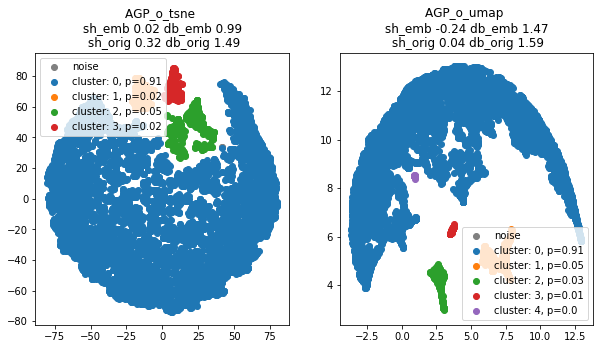

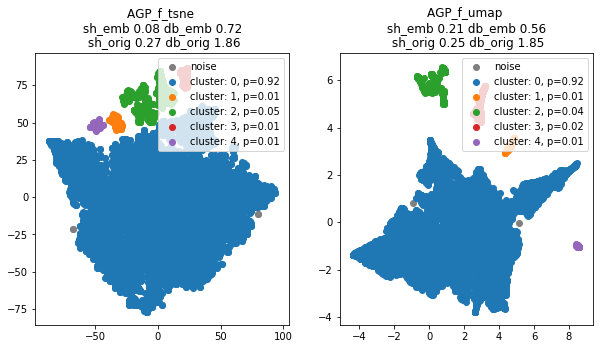

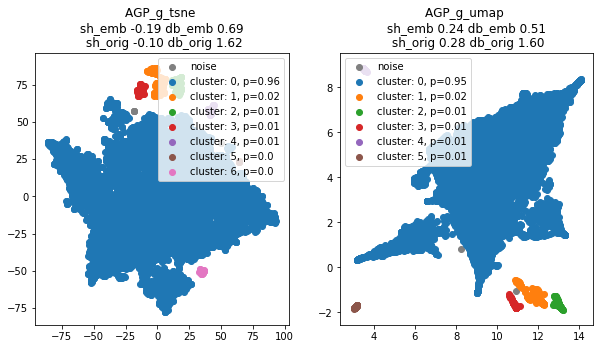

In [168]:
for tax_level in ['o', 'f', 'g']:
    fig,axes = plt.subplots(ncols=2, nrows=1, figsize=(10,5))
    for i,(method_name) in enumerate(methods.keys()):
        label = '_'.join([dataset, tax_level, method_name])
        embedding =embeddings[label]
        y = clustering_results[label]['y']
        n_clusters = len(np.unique(y[y!=-1]))
        
        sh_emb, db_emb, sh_orig, db_orig = '','','',''
        if n_clusters > 1:
            sh_emb = clustering_results[label]['sh_emb']
            db_emb = clustering_results[label]['db_emb']
            sh_orig = clustering_results[label]['sh_orig']
            db_orig = clustering_results[label]['db_orig']
        
        axes[i].scatter(embedding[:, 0][y==-1], embedding[:, 1][y==-1], label=f'noise', color='grey')
        for k in range(n_clusters):
            p = round(sum(y==k)/len(y),2)
            axes[i].scatter(embedding[:, 0][y==k], embedding[:, 1][y==k], label=f'cluster: {k}, p={p}')
        axes[i].set_title(' '.join([label, '\n',\
                                    'sh_emb', sh_emb, \
                                    'db_emb', db_emb, \
                                    '\n',\
                                    'sh_orig', sh_orig, \
                                    'db_orig', db_orig]))
        axes[i].legend()
plt.show()

Higher dimensionality leads to more clusters shards and higher gap

In [39]:
def calc_intersection(y1,y2):
    y1_unique = np.unique(y1)
    y2_unique = np.unique(y2)
    sim = np.zeros((len(y1_unique),len(y2_unique)))
    for i in y1_unique:
        for j in y2_unique:
            sim[i,j] = ((y1==i)*(y2==j)).sum()/sum(y1==i)
    return sim

In [40]:
def v_measure_score_smallest(y1,y2):
    most_similar_mask = (y1 == 0)*(y2 == 0)
    return v_measure_score(y1[~most_similar_mask],
                           y2[~most_similar_mask])

In [41]:
y_s = []
labels = []
for k,v in clustering_results.items():
    y = v['y']
    y_s.append(y)
    labels.append(k)
y_s = np.stack(y_s)

In [ ]:
v_measure_score()

In [42]:
Y = squareform(pdist(y_s, metric=v_measure_score_smallest))

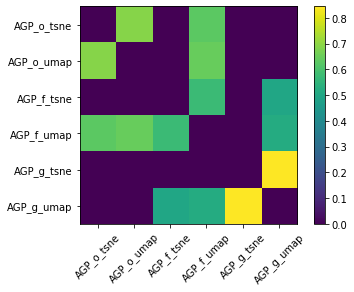

In [74]:
Y_thr = Y.copy()
Y_thr[Y_thr < 0.5] = 0.
plt.imshow(Y_thr)
plt.xticks(ticks=np.arange(len(labels)), labels=labels, rotation=45)
plt.yticks(ticks=np.arange(len(labels)), labels=labels, rotation=0)
plt.colorbar()
plt.show()

In [165]:
# y = clustering_results['AGP_g_tsne']['y']
# for y_s in np.unique(y):
#     if y_s>0:
#         mask = y==y_s
#         s = data_orig['AGP_g'][['g__Bacteroides', 'g__Prevotella', 'g__Ruminococcus']][mask].sum(0)
#         plt.figure()
#         plt.bar(s.index, s.values)
#         plt.title(f'y={y_s}')
#         plt.show()

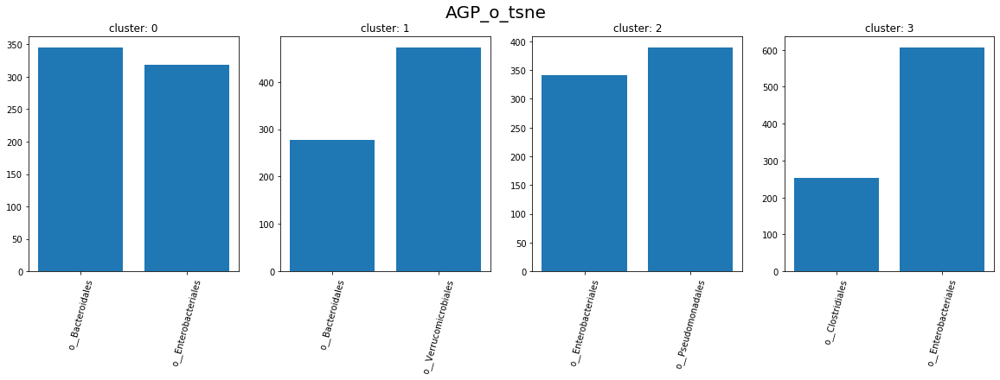

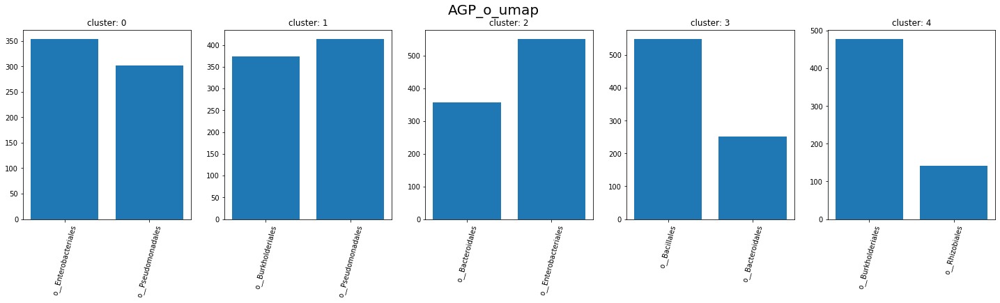

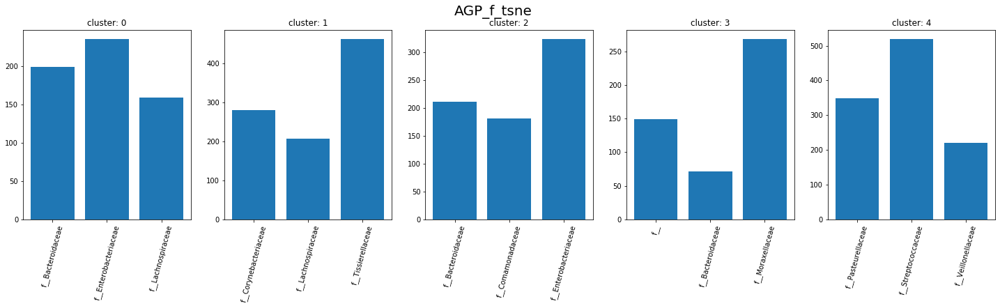

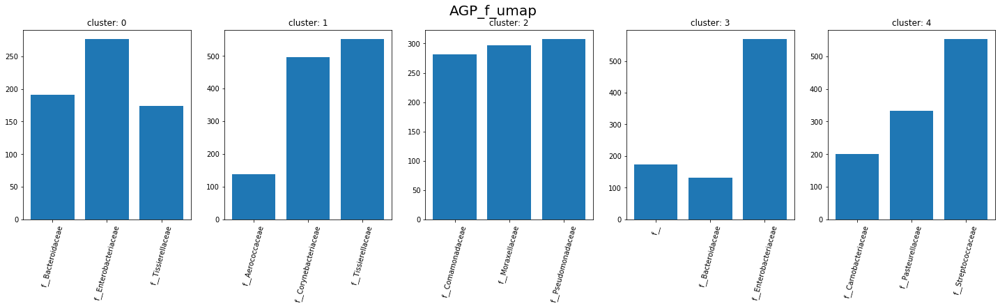

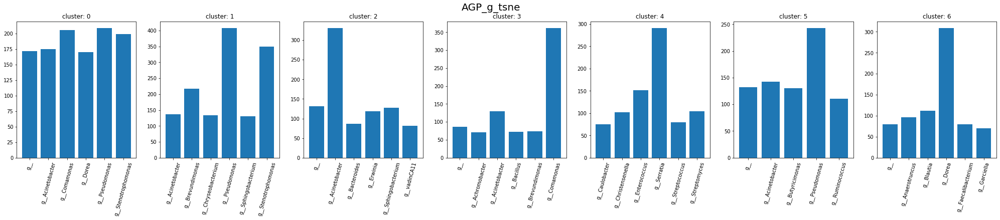

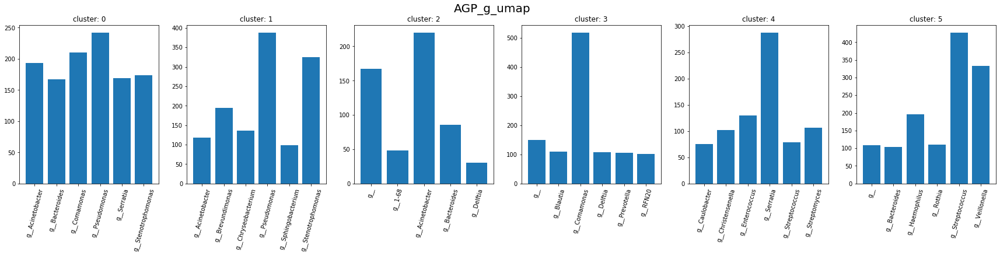

In [90]:
classification_results = defaultdict(dict)
for k,v in clustering_results.items():
    y = v['y']
    dataframe_orig = data_orig['_'.join(k.split('_')[:-1])]
    clusters = np.unique(y[y!=-1])
    fig, axes = plt.subplots(ncols=len(clusters), nrows=1, figsize=(len(clusters)*5,5))
    for i,cluster_number in enumerate(clusters):
        X_train = dataframe_orig.values
        features_names = dataframe_orig.columns
        y_train = np.zeros(len(X_train))
        y_train[y==cluster_number] = 1.
        est = LGBMClassifier(random_state=42)
        cross_val_score(est, X_train, y_train, scoring='f1').mean()
        est.fit(X_train, y_train)
        f_imp = est.feature_importances_
        imp_mask = f_imp > np.quantile(f_imp, q=0.99)
        axes[i].bar(x=features_names[imp_mask],
                height=f_imp[imp_mask])
        axes[i].set_xticklabels(labels = features_names[imp_mask], rotation=75)
        axes[i].set_title(f'cluster: {cluster_number}')
    fig.suptitle(k, fontsize=20)
plt.show()

    

# AGP, UMAP
## Tax O: 
### cluster 1: o__Burkholderiales	o__Pseudomonadales  
### cluster 2: o__Bacteroidales	o__Enterobacteriales
### cluster 3:  o__Bacillales

# ptb, UMAP
## Tax O: 
### cluster 1: o__Bacteroidales	o__Enterobacteriales	o__Lactobacillales	o__Pseudomonadales
### cluster 2: o__Bacteroidales	o__Enterobacteriales
### cluster 3: o__Actinomycetales	o__Bacillales  
### cluster 4: o__Rhizobiales

# AGP, TSNE
## Tax O: 
### cluster 1: 
### cluster 2: 
### cluster 3:  

# ptb, TSNE
## Tax O: 
### cluster 1: 
### cluster 2: 
### cluster 3: 
### cluster 4: 


### How big is the gap?

# t-SNE with different hp

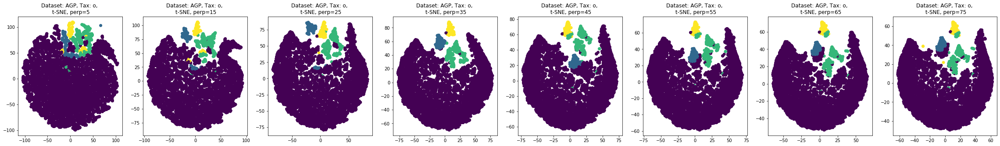

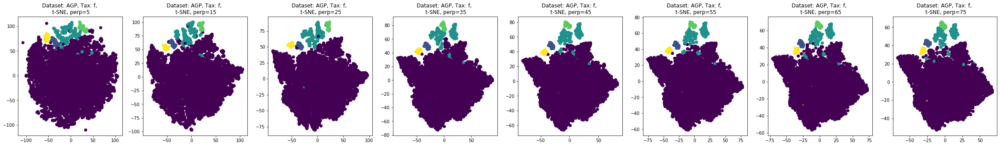

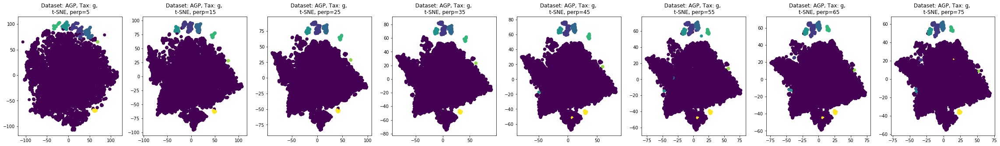

In [100]:
dataset = 'AGP'
perplexities = np.arange(5,85,10)

for tax_level in ['o', 'f', 'g']:
    data_out = datasets_separate[f'{dataset}_proj_{tax_level}']
    y = clustering_results[f'{dataset}_{tax_level}_tsne']['y']
    non_noise_mask = y!=-1
    fig,axes = plt.subplots(ncols=len(perplexities), nrows=1, figsize=(len(perplexities)*5,5))
    for i,p in enumerate(perplexities):
        method = TSNE(n_components=2, perplexity=p, metric='manhattan', random_state=42, init='pca', n_jobs=-1)
        embedding = method.fit_transform(data_out)
        axes[i].scatter(embedding[:, 0][non_noise_mask], embedding[:, 1][non_noise_mask], c=y[non_noise_mask])
        axes[i].set_title(f'Dataset: {dataset}, Tax: {tax_level}, \n t-SNE, perp={p}')
plt.show()

# UMAP with different hp

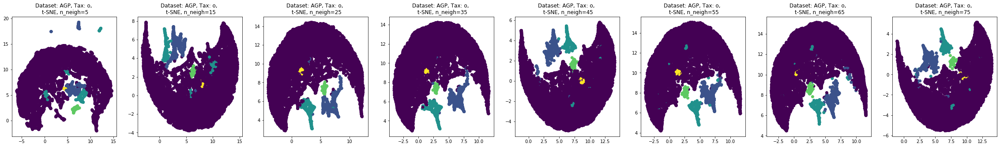

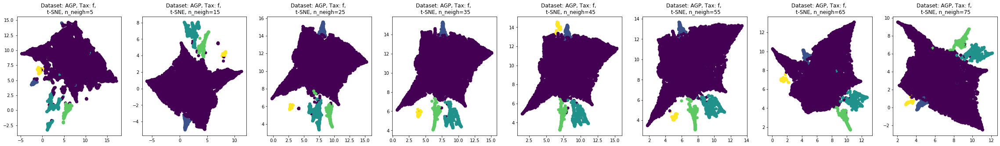

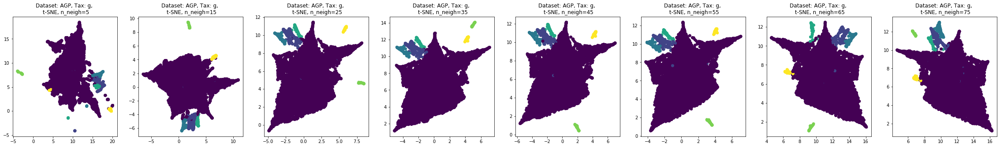

In [102]:
dataset = 'AGP'
n_neighbors = np.arange(5,85,10)
for tax_level in ['o', 'f', 'g']:
    data_out = datasets_separate[f'{dataset}_proj_{tax_level}']
    y = clustering_results[f'{dataset}_{tax_level}_umap']['y']
    non_noise_mask = y!=-1
    fig,axes = plt.subplots(ncols=len(n_neighbors), nrows=1, figsize=(len(n_neighbors)*5,5))
    for i,nn in enumerate(n_neighbors):
        method = UMAP(n_neighbors=nn, n_components=2, min_dist=0.2, spread = 1., metric='manhattan')
        embedding = method.fit_transform(data_out)
        axes[i].scatter(embedding[:, 0][non_noise_mask], embedding[:, 1][non_noise_mask], c=y[non_noise_mask])
        axes[i].set_title(f'Dataset: {dataset}, Tax: {tax_level}, \n UMAP, n_neigh={nn}')
plt.show()

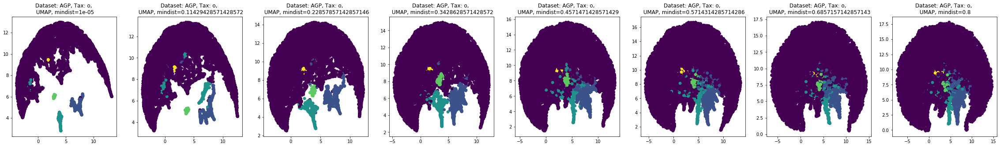

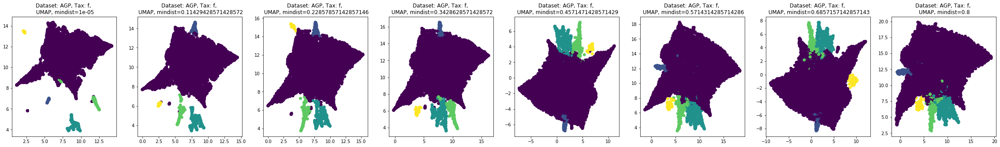

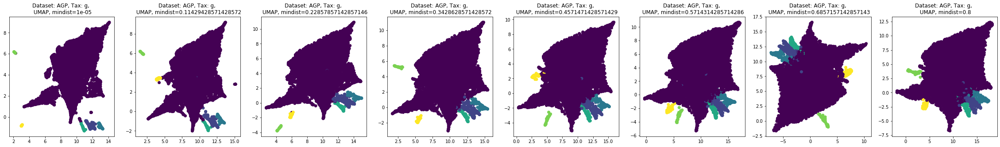

In [103]:
dataset = 'AGP'
mindist = np.linspace(1e-5,0.8,num=8)
for tax_level in ['o', 'f', 'g']:
    data_out = datasets_separate[f'{dataset}_proj_{tax_level}']
    y = clustering_results[f'{dataset}_{tax_level}_umap']['y']
    non_noise_mask = y!=-1
    fig,axes = plt.subplots(ncols=len(mindist), nrows=1, figsize=(len(mindist)*5,5))
    for i,md in enumerate(mindist):
        method = UMAP(n_neighbors=30, n_components=2, min_dist=md, spread = 1., metric='manhattan')
        embedding = method.fit_transform(data_out)
        axes[i].scatter(embedding[:, 0][non_noise_mask], embedding[:, 1][non_noise_mask], c=y[non_noise_mask])
        axes[i].set_title(f'Dataset: {dataset}, Tax: {tax_level}, \n UMAP, mindist={md}')
plt.show()